# SUMMARY

## [Import libraries and files](#ch0)

# [1 - Remove tags](#ch1)

# [2 - Tokenize ](#ch2)

# [3 - Lemmatize ](#ch3)

# [4 - Whole function ](#ch4)

# [5 - Tags ](#ch5)

# [6 - Features Extract ](#ch6)

# [7 - RNN Models ](#ch7)

# [8 - LDA ](#ch8)



## [Export](#ch99)

<a id="ch0"></a>
## Import libraries and files

In [8]:
import numpy as np
import pandas as pd
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
import seaborn as sns
import time
import pickle

# Tokenize
import nltk
from collections import Counter
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
import re

# NER
import spacy

# Features Extract
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from wordcloud import WordCloud

# RNN models

import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import tensorflow_hub as hub

import os
import transformers
from transformers import AutoTokenizer

import gensim

#LDA

import gensim.corpora as corpora
import pyLDAvis
import pyLDAvis.gensim_models
from gensim.models import CoherenceModel

# Test models
from sklearn.linear_model import SGDClassifier, LogisticRegression

In [9]:
PATH_DATA = '/Users/alexandremonod/Python/OC_ML/p5/data'
PATH_MODELS = '/Users/alexandremonod/Python/OC_ML/p5/models'

In [10]:
# SUPPR QUAND SOUTENANCE

'''# PROBELM importing nltk --> need this fix
import nltk
import ssl

try:
    _create_unverified_https_context = ssl._create_unverified_context
except AttributeError:
    pass
else:
    ssl._create_default_https_context = _create_unverified_https_context

nltk.download()

# Then dl "popular" package'''

'# PROBELM importing nltk --> need this fix\nimport nltk\nimport ssl\n\ntry:\n    _create_unverified_https_context = ssl._create_unverified_context\nexcept AttributeError:\n    pass\nelse:\n    ssl._create_default_https_context = _create_unverified_https_context\n\nnltk.download()\n\n# Then dl "popular" package'

In [11]:
query_results = pd.read_csv(f"{PATH_DATA}/query_results.csv")

In [12]:
query_results.iloc[0].Body

"<p>Is it possible to define a class in C# such that</p>\n\n<pre><code>class GenericCollection&lt;T&gt; : SomeBaseCollection&lt;T&gt; where T : Delegate\n</code></pre>\n\n<p>I couldn't for the life of me accomplish this last night in .NET 3.5. I tried using</p>\n\n<p><code>delegate, Delegate, Action&lt;T&gt; and Func&lt;T, T&gt;</code></p>\n\n<p>It seems to me that this should be allowable in some way. I'm trying to implement my own EventQueue.</p>\n\n<p>I ended up just doing this [primitive approximation mind you].</p>\n\n<pre><code>internal delegate void DWork();\n\nclass EventQueue {\n    private Queue&lt;DWork&gt; eventq;\n}\n</code></pre>\n\n<p>But then I lose the ability to reuse the same definition for different types of functions.</p>\n\n<p>Thoughts?</p>\n"

<a id="ch1"></a>
## I - Remove tags

In [13]:
query_results.head(3)

,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount
0,C# Generics won't allow Delegate Type Constraints,<p>Is it possible to define a class in C# such...,<c#><generics><events><delegates><constraints>,191940,81,29837,12,8
1,How do you get a directory listing in C?,<p>How do you scan a directory for folders and...,<c><file><directory><cross-platform><common-ta...,12489,69,139075,22,9
2,Returning DataTables in WCF/.NET,<p>I have a WCF service from which I want to r...,<c#><.net><wcf><web-services><datatable>,12702,51,56460,12,8


In [14]:
# Show before suppr
print(query_results.Body[0])

<p>Is it possible to define a class in C# such that</p>

<pre><code>class GenericCollection&lt;T&gt; : SomeBaseCollection&lt;T&gt; where T : Delegate
</code></pre>

<p>I couldn't for the life of me accomplish this last night in .NET 3.5. I tried using</p>

<p><code>delegate, Delegate, Action&lt;T&gt; and Func&lt;T, T&gt;</code></p>

<p>It seems to me that this should be allowable in some way. I'm trying to implement my own EventQueue.</p>

<p>I ended up just doing this [primitive approximation mind you].</p>

<pre><code>internal delegate void DWork();

class EventQueue {
    private Queue&lt;DWork&gt; eventq;
}
</code></pre>

<p>But then I lose the ability to reuse the same definition for different types of functions.</p>

<p>Thoughts?</p>



In [15]:
def suppr_balises_html(text):
 
    soup = BeautifulSoup(text, "html.parser")
#    for data in soup(['style', 'script']):
 #         data.decompose()
            
    text_out = ' '.join(soup.stripped_strings)
    # Remove \n
    text_out = text_out.replace("\n", " ")        
    return text_out

In [16]:
# Apply function
test = suppr_balises_html(query_results.Body[0])

In [17]:
# Show after suppr
test

"Is it possible to define a class in C# such that class GenericCollection<T> : SomeBaseCollection<T> where T : Delegate I couldn't for the life of me accomplish this last night in .NET 3.5. I tried using delegate, Delegate, Action<T> and Func<T, T> It seems to me that this should be allowable in some way. I'm trying to implement my own EventQueue. I ended up just doing this [primitive approximation mind you]. internal delegate void DWork();  class EventQueue {     private Queue<DWork> eventq; } But then I lose the ability to reuse the same definition for different types of functions. Thoughts?"

In [18]:
# SUPPR QUAND SOUTENANCE
'''soup = BeautifulSoup(test)
soup
# Remove \n
soup.get_text().replace("\n", " ")'''

'soup = BeautifulSoup(test)\nsoup\n# Remove \n\nsoup.get_text().replace("\n", " ")'

<a id="ch2"></a>
## II - Tokenize

In [20]:
soup = BeautifulSoup(test)
soup.get_text().replace("\n", " ")

"Is it possible to define a class in C# such that class GenericCollection : SomeBaseCollection where T : Delegate I couldn't for the life of me accomplish this last night in .NET 3.5. I tried using delegate, Delegate, Action and Func It seems to me that this should be allowable in some way. I'm trying to implement my own EventQueue. I ended up just doing this [primitive approximation mind you]. internal delegate void DWork();  class EventQueue {     private Queue eventq; } But then I lose the ability to reuse the same definition for different types of functions. Thoughts?"

In [21]:
# Words lowered to be all the same - and avoid case issues
test = str(soup).lower()
test

'is it possible to define a class in c# such that class genericcollection<t> : somebasecollection<t> where t : delegate i couldn\'t for the life of me accomplish this last night in .net 3.5. i tried using delegate, delegate, action<t> and func<t, t=""> it seems to me that this should be allowable in some way. i\'m trying to implement my own eventqueue. i ended up just doing this [primitive approximation mind you]. internal delegate void dwork();  class eventqueue {     private queue<dwork> eventq; } but then i lose the ability to reuse the same definition for different types of functions. thoughts?</dwork></t,></t></t></t>'

In [22]:
# Tokenize without ponctuation
tokenizer = nltk.RegexpTokenizer(r'\w+')
tokenized = tokenizer.tokenize(test)

In [23]:
# First cleaning of stopwords
# Suppr most frequent words and small words (<2)
stopwords = nltk.corpus.stopwords.words('english')
test_without_sw = [word for word in tokenized if word not in stopwords and len(word) > 2]
test_without_sw

['possible',
 'define',
 'class',
 'class',
 'genericcollection',
 'somebasecollection',
 'delegate',
 'life',
 'accomplish',
 'last',
 'night',
 'net',
 'tried',
 'using',
 'delegate',
 'delegate',
 'action',
 'func',
 'seems',
 'allowable',
 'way',
 'trying',
 'implement',
 'eventqueue',
 'ended',
 'primitive',
 'approximation',
 'mind',
 'internal',
 'delegate',
 'void',
 'dwork',
 'class',
 'eventqueue',
 'private',
 'queue',
 'dwork',
 'eventq',
 'lose',
 'ability',
 'reuse',
 'definition',
 'different',
 'types',
 'functions',
 'thoughts',
 'dwork']

<a id="ch3"></a>
## III - Lemmatize

In [24]:
# First need to POS-tag tokens
test_postagged = dict(nltk.pos_tag(test_without_sw))
test_postagged 

{'possible': 'JJ',
 'define': 'JJ',
 'class': 'NN',
 'genericcollection': 'NN',
 'somebasecollection': 'NN',
 'delegate': 'NN',
 'life': 'NN',
 'accomplish': 'JJ',
 'last': 'JJ',
 'night': 'NN',
 'net': 'NN',
 'tried': 'VBD',
 'using': 'VBG',
 'action': 'NN',
 'func': 'NN',
 'seems': 'VBZ',
 'allowable': 'JJ',
 'way': 'NN',
 'trying': 'VBG',
 'implement': 'JJ',
 'eventqueue': 'NN',
 'ended': 'VBD',
 'primitive': 'JJ',
 'approximation': 'NN',
 'mind': 'IN',
 'internal': 'JJ',
 'void': 'NN',
 'dwork': 'NN',
 'private': 'JJ',
 'queue': 'NN',
 'eventq': 'VBP',
 'lose': 'JJ',
 'ability': 'NN',
 'reuse': 'VBP',
 'definition': 'NN',
 'different': 'JJ',
 'types': 'NNS',
 'functions': 'NNS',
 'thoughts': 'NNS'}

In [25]:
# Function to convert pos_tag tags to WordNetLemmatizer tags
def get_wordnet_pos(pos_tag):
    if pos_tag.startswith('J'):
        return wordnet.ADJ
    elif pos_tag.startswith('V'):
        return wordnet.VERB
    elif pos_tag.startswith('N'):
        return wordnet.NOUN
    elif pos_tag.startswith('R'):
        return wordnet.ADV
    else:
        return None

In [26]:
# Replace values of the dictionary
def replace_pos(tokens):
    k = 0
    for i in tokens.keys():
        tokens[i] = get_wordnet_pos(tokens[i])
        k += 1
    return tokens

In [27]:
postagged = replace_pos(test_postagged)

In [28]:
def lemmatize(tokens):
    WNlemmatizer = WordNetLemmatizer()
    lem_tokens = []
    for key in tokens.keys():
        if tokens[key] is None :    # In case there are no tags
            lem_tokens.append(key)
        else :
            lem_tokens.append(WNlemmatizer.lemmatize(key, pos=tokens[key]) )
    return lem_tokens

lemmatize(postagged)

['possible',
 'define',
 'class',
 'genericcollection',
 'somebasecollection',
 'delegate',
 'life',
 'accomplish',
 'last',
 'night',
 'net',
 'try',
 'use',
 'action',
 'func',
 'seem',
 'allowable',
 'way',
 'try',
 'implement',
 'eventqueue',
 'end',
 'primitive',
 'approximation',
 'mind',
 'internal',
 'void',
 'dwork',
 'private',
 'queue',
 'eventq',
 'lose',
 'ability',
 'reuse',
 'definition',
 'different',
 'type',
 'function',
 'thought']

In [29]:
# Functions

def listToString(s):
 
    # initialize an empty string
    str1 = ""
 
    # traverse in the string
    for ele in s:
        str1 += ele + ' '
 
    # return string
    return str1

# A améliorer avec Daouda
def keep_nouns(sentence):
    #nlp = spacy.load("en_core_web_sm")  Mettait plus d'une heure à s'exécuter
    #sentence_nlp = nlp(sentence)
    liste = []
    for word in sentence:
        if word.pos_ == "NOUN" or word.pos_ == "PROPN":
            liste.append(word)
    return liste

In [30]:
nlp = spacy.load("en_core_web_sm")

/opt/anaconda3/envs/tf/lib/python3.7/site-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/opt/anaconda3/envs/tf/lib/python3.7/site-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/opt/anaconda3/envs/tf/lib/python3.7/site-packages/catalogue.py:126: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/opt/anaconda3/envs/tf/lib/python3.7/site-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):


<a id="ch4"></a>
## IV - Whole function

In [31]:
def tokenization_full(text):
    text_out = suppr_balises_html(text)
    text_out = text_out.lower()
    # Tokenize
    tokenizer = nltk.RegexpTokenizer(r'\w+')
    tokenized = tokenizer.tokenize(text_out)
    # Stopwords
    stopwords = nltk.corpus.stopwords.words('english')
    text_without_sw = [word for word in tokenized if word not in stopwords and len(word) > 2]
    # First need to POS-tag tokens
    postagged = dict(nltk.pos_tag(text_without_sw))
    tokens = replace_pos(postagged)
    lem_tokens = lemmatize(tokens)
    # NER
    tokens_from_list_to_strings = listToString(lem_tokens)
    sentences_nlp_ = nlp(tokens_from_list_to_strings)
    ner_tokens = keep_nouns(sentences_nlp_)
    detokenized = [token.text_with_ws for token in ner_tokens]
    #detokenized = str(detokenized)   Pour quelle partie le str était-il nécessaire ????
    return detokenized

In [32]:
query_results["body_cleaned"] = query_results.Body.apply(tokenization_full)

/opt/anaconda3/envs/tf/lib/python3.7/site-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/opt/anaconda3/envs/tf/lib/python3.7/site-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/opt/anaconda3/envs/tf/lib/python3.7/site-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/opt/anaconda3/envs/tf/lib/python3.7/site-packages/catalogue.py:138: DeprecationWarning: SelectableGroups dict interface is deprecated. Use select.
  for entry_point in AVAILABLE_ENTRY_POINTS.get(self.entry_point_namespace, []):
/opt/anaconda3/envs/tf/lib/python3.7/site-packages/catalogue.py:138: DeprecationWarn

<a id="ch5"></a>
## V - Tags

In [33]:
def clean_tags(tags):
    # Separate tags
    pattern_brackets = r"\<.*?\>"
    tags_separated = re.findall(pattern_brackets, tags)
    # Remove brackets
    pattern_remove_brackets = r'[<>]'
    tags_cleaned = [re.sub(pattern_remove_brackets, '', word) for word in tags_separated]
    return tags_cleaned

In [35]:
query_results["tags_cleaned"] = query_results.Tags.apply(clean_tags)

In [36]:
# Keep only 100 most common tags
list_tags = []
for i in query_results.tags_cleaned:
    list_tags.extend(i)

tags_sorted = Counter(list_tags).most_common(100)
tags_sorted = dict(tags_sorted)

# Function
def remove_rare_tags(list_of_tags):
    new_list = []
    for tag in list_of_tags:
        if tag in tags_sorted.keys():
            new_list.append(tag)
    return new_list

query_results["tags_cleaned_selected"] = query_results.tags_cleaned.apply(remove_rare_tags)
query_results.head(15)

,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount,body_cleaned,tags_cleaned,tags_cleaned_selected
0,C# Generics won't allow Delegate Type Constraints,<p>Is it possible to define a class in C# such...,<c#><generics><events><delegates><constraints>,191940,81,29837,12,8,"[define , class , genericcollection , somebase...","[c#, generics, events, delegates, constraints]",[c#]
1,How do you get a directory listing in C?,<p>How do you scan a directory for folders and...,<c><file><directory><cross-platform><common-ta...,12489,69,139075,22,9,"[scan , directory , folder , file , cross , pl...","[c, file, directory, cross-platform, common-ta...","[c, file]"
2,Returning DataTables in WCF/.NET,<p>I have a WCF service from which I want to r...,<c#><.net><wcf><web-services><datatable>,12702,51,56460,12,8,"[wcf , service , return , know , topic , retur...","[c#, .net, wcf, web-services, datatable]","[c#, .net]"
3,How to create a DataFrame from a text file in ...,<p>I have a text file on HDFS and I want to co...,<scala><apache-spark><dataframe><apache-spark-...,36766322,21,168246,12,8,"[text , file , hdfs , convert , data , frame ,...","[scala, apache-spark, dataframe, apache-spark-...","[scala, apache-spark, dataframe]"
4,mysqli or PDO - what are the pros and cons?,<p>In our place we're split between using mysq...,<php><mysql><pdo><mysqli><database-abstraction>,13569,342,145444,285,13,"[place , split , use , mysqli , stuff , statem...","[php, mysql, pdo, mysqli, database-abstraction]","[php, mysql]"
5,How to load plugins in .NET?,<p>I'd like to provide some way of creating dy...,<.net><windows><plugins><add-in><extensibility>,14278,27,14769,15,8,"[way , plugins , software , use , winapi , fun...","[.net, windows, plugins, add-in, extensibility]","[.net, windows]"
6,Increasing camera capture resolution in OpenCV,"<p>In my C/C++ program, I'm using <a href=""htt...",<c><image><opencv><webcam><resolutions>,14287,52,78108,26,15,"[program , use , opencv , capture , image , we...","[c, image, opencv, webcam, resolutions]","[c, image, opencv]"
7,Change templates in Xcode,<p>How would I change the initial templates cr...,<xcode><macos><templates><xcode4><xcode4.5>,33720,113,50902,65,10,"[template , xcode , cocoa , class , refer , co...","[xcode, macos, templates, xcode4, xcode4.5]","[xcode, macos]"
8,WordPress MediaWiki integration,"<p>On the other end of the spectrum, I would b...",<php><mysql><wordpress><lamp><mediawiki>,33745,10,18616,11,6,"[end , spectrum , wiki , share , login , crede...","[php, mysql, wordpress, lamp, mediawiki]","[php, mysql]"
9,What is tail recursion?,"<p>Whilst starting to learn lisp, I've come ac...",<algorithm><language-agnostic><functional-prog...,33923,1956,559426,907,31,"[start , lisp , term , tail ]","[algorithm, language-agnostic, functional-prog...",[algorithm]


In [37]:
# Get rid of rows with empty tags
query_results = query_results[query_results.tags_cleaned_selected.astype(str) != '[]']
query_results.reset_index(drop=True, inplace=True)

<a id="ch6"></a>
## VI - Features Extract

In [38]:
cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=10, preprocessor=' '.join) # Take words that appear at least 10 times
ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=10, preprocessor=' '.join)

cv_fit = cvect.fit(query_results.body_cleaned)
ctf_fit = ctf.fit(query_results.body_cleaned)

cv_transform = cvect.transform(query_results.body_cleaned)
ctf_transform = ctf.transform(query_results.body_cleaned)

ft_cv = cv_fit.get_feature_names_out()
ft_ctf = ctf_fit.get_feature_names_out() 

In [39]:
cvect_vocabulary = cvect.vocabulary_
pickle.dump(cvect_vocabulary, open(f"{PATH_MODELS}/cvect_vocabulary.pkl", 'wb'))

In [40]:
cv_data = pd.DataFrame.sparse.from_spmatrix(cv_transform, columns=ft_cv)
cv_data

,0px,100ms,100px,10k,10px,16dp,1px,1st,200px,20px,...,zeros,zip,zipcode,zipfile,zlib,zombie,zone,zoom,zsh,zygoteinit
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26150,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
26151,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
26152,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
26153,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [41]:
ctf_data = pd.DataFrame.sparse.from_spmatrix(ctf_transform, columns=ft_ctf)
ctf_data

,0px,100ms,100px,10k,10px,16dp,1px,1st,200px,20px,...,zeros,zip,zipcode,zipfile,zlib,zombie,zone,zoom,zsh,zygoteinit
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26150,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
26151,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
26152,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
26153,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [42]:
# Ajout col 
cv_data["tag"] = query_results["tags_cleaned_selected"]
ctf_data["tag"] = query_results["tags_cleaned_selected"]

In [43]:
cv_data.to_pickle(f"{PATH_DATA}/cv_data.pkl")
ctf_data.to_pickle(f"{PATH_DATA}/ctf_data.pkl")

In [44]:
# Visualisation Word Cloud
tokens_tag = []
for list in query_results["tags_cleaned_selected"]:
    for token in list:
        tokens_tag.append(token)

# First calculate frequency
Word_dist = nltk.FreqDist(tokens_tag)
df_freq_tags = pd.DataFrame(Word_dist.most_common(),columns=['Tags', 'Frequency'])
df_freq_tags

,Tags,Frequency
0,python,3169
1,java,3111
2,javascript,2751
3,c#,2683
4,ios,2416
...,...,...
95,function,167
96,laravel,166
97,date,165
98,gradle,165


In [45]:
df_freq_tags.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Tags       100 non-null    object
 1   Frequency  100 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 1.7+ KB


/opt/anaconda3/envs/tf/lib/python3.7/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/opt/anaconda3/envs/tf/lib/python3.7/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/opt/anaconda3/envs/tf/lib/python3.7/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/opt/anaconda3/envs/tf/lib/python3.7/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size 

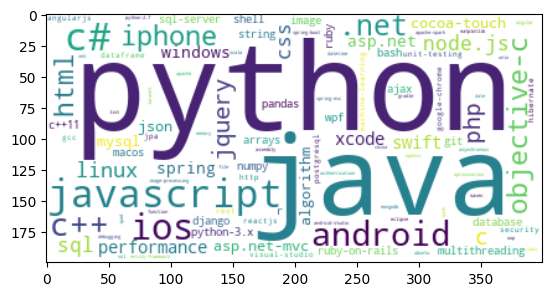

In [46]:
# Affichage du nuage de tags prédits sur le jeu de tests
cloud_generator = WordCloud(background_color = 'white', random_state=1)
dict_freq = dict(zip(df_freq_tags.Tags, df_freq_tags.Frequency))
wordcloud_image = cloud_generator.generate_from_frequencies(dict_freq)
plt.imshow(wordcloud_image, interpolation = "bilinear")

<a id="ch7"></a>
## VII - RNN Models

<a id="ch7-1"></a>
### 7 - 1 - Word2Vec

In [47]:
w2v_size=300
w2v_window=5 # N de mots qui vont entourer le mot choisi ; le contexte en fait
w2v_min_count=1 # min_count : ignore all words with frequency lower than this
w2v_epochs=100
maxlen = 24 # adapt to length of sentences
sentences = query_results['Body'].astype(str).to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

In [48]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                                vector_size=w2v_size,
                                                seed=42,
                                                workers=1)
#                                                workers=multiprocessing.cpu_count())
w2v_model.build_vocab(sentences) # prepare the model vocabulary - le modèle a besoin d'avoir déjà, en amont, la liste des mots
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs) 
                        # total_examples : nb de sentences ; = len(sentences)
                        # epochs : nb d'iterations sur le corpus
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 99079
Word2Vec trained


In [49]:
### 1ère étape
# On entraine le modèle pour avoir le poids des mots
# Dans le RNN à venir, on va lui donner une phrase qui est une lsite de mots (chaque mot avec un embedding, donné par la mtrice)
# En sortie, il va me donner un vecteur avec un average
# A la fin on applique un Global Average

# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                                                     maxlen=maxlen,
                                                     padding='post') 
                                                   
num_words = tokenizer.document_count
print("Number of unique words: %i" % num_words)

# Création de la matrice d'embedding par phrases

print("Create Embedding matrix ...")
w2v_size = 300
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0

### POUR LES MOTS

for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]

### Passer de la matrice d'embedding par mot à une matrice d'embedding par phrase
### C'est la moyenne des matrices d'embedding de chaque mot présent dans la phrase
### C'est à ça qu'est censée servir la fonction au-dessus
### On doit arriver à 276000 lignes et pas 100 000
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Fit Tokenizer ...
Number of unique words: 26155
Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (99080, 300)


In [50]:
# Global Average Pooling

input = Input(shape=(len(x_sentences),
                      maxlen), dtype='float64')
word_input = Input(shape=(maxlen), dtype='float64')
word_embedding = Embedding(input_dim=vocab_size,
                                        output_dim=w2v_size,
                                        weights=[embedding_matrix],
                                        input_length=maxlen)(word_input)
word_vec = GlobalAveragePooling1D()(word_embedding)
embed_model = Model([word_input], word_vec)

embeddings = embed_model.predict(x_sentences)
print(embeddings.shape)        
print('Modèle terminé !')
print(embeddings)

2022-12-27 16:59:51.141270: I tensorflow/core/platform/cpu_feature_guard.cc:145] This TensorFlow binary is optimized with Intel(R) MKL-DNN to use the following CPU instructions in performance critical operations:  SSE4.1 SSE4.2
To enable them in non-MKL-DNN operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-27 16:59:51.145005: I tensorflow/core/common_runtime/process_util.cc:115] Creating new thread pool with default inter op setting: 8. Tune using inter_op_parallelism_threads for best performance.


(26155, 300)
Modèle terminé !
[[ 0.290784    0.33093718 -0.18325381 ...  0.03927715 -0.5808894
   0.76536924]
 [ 0.5490854   0.08675659  0.21406329 ... -0.44897342 -0.33858296
   0.9032135 ]
 [ 0.71855944  0.27932048 -0.375116   ... -0.09721925 -0.16455889
   1.3634377 ]
 ...
 [ 0.3495221   0.56841666  0.0806139  ... -0.28200075 -0.6401182
  -0.08951676]
 [ 1.0140833   0.00802763 -0.33908162 ... -0.40773895 -0.32572797
   1.1303445 ]
 [-0.52712464 -0.08655349  0.49470472 ... -0.23535341 -0.29564226
  -0.6546499 ]]


In [51]:
w2v_data = pd.DataFrame(embeddings)
w2v_data["tag"] = query_results["tags_cleaned_selected"]
### Export en csv
w2v_data.to_pickle(f"{PATH_DATA}/w2v.pkl")

<a id="ch99"></a>
### Export

In [52]:
to_export = query_results.copy()
to_export.drop(["Body", "Tags", 'tags_cleaned'], axis=1, inplace=True)
to_export.rename(columns={"body_cleaned":"body", "tags_cleaned_selected":"tags"}, inplace=True)

# Le format pickle conserve les formats (notamment les listes)
to_export.to_pickle(f"{PATH_DATA}/data.pkl")